In [1]:
import numpy as np
import pandas as pd
import itertools as it
from mne import read_epochs
from mne.filter import filter_data
import matplotlib.pylab as plt
from scipy.signal import savgol_filter
from scipy.spatial.distance import euclidean
from scipy.interpolate import interp2d, interp1d

import trimesh
import slam.io as sio
import nibabel as nib
import matplotlib
from matplotlib import colors
matplotlib.use("Qt5Agg")

from freesurfer_tools import transform_atlas
import new_files

In [2]:
files = new_files.Files()

In [3]:
tsv_paths = files.get_files(
    "/home/common/bonaiuto/cued_action_meg/derivatives/processed/sub-001/ses-01/inverse/",
    "*.tsv", prefix="multilayer_MU"
)

epo_paths = files.get_files(
    "/home/common/bonaiuto/cued_action_meg/derivatives/processed/sub-001/ses-01/",
    "*.fif", strings=["autoreject", "sub-001", "visual1", "001-v"], 
)
print(epo_paths)
print(tsv_paths)

['/home/common/bonaiuto/cued_action_meg/derivatives/processed/sub-001/ses-01/autoreject-sub-001-ses-01-001-visual1-epo.fif']
['/home/common/bonaiuto/cued_action_meg/derivatives/processed/sub-001/ses-01/inverse/multilayer_MU_spm-converted_filt_autoreject-sub-001-ses-01-001-visual1-epo.tsv', '/home/common/bonaiuto/cued_action_meg/derivatives/processed/sub-001/ses-01/inverse/multilayer_MU_spm-converted_nofilt_autoreject-sub-001-ses-01-001-visual1-epo.tsv']


In [4]:
MU_filt = pd.read_csv(tsv_paths[0], sep="\t", header=None)
MU_nofilt = pd.read_csv(tsv_paths[1], sep="\t", header=None)

In [5]:
epochs = read_epochs(epo_paths[0], verbose=False)
epochs = epochs.pick_types(meg=True, ref_meg=False, misc=False)
epochs_info = epochs.info
epochs_times = epochs.times
epochs = epochs.get_data()

In [6]:
annot_paths = [
    "/home/mszul/git/DANC_multilayer_laminar/assets/lh.HCPMMP1.annot",
    "/home/mszul/git/DANC_multilayer_laminar/assets/rh.HCPMMP1.annot"
]
fsavg_sphere_paths = [
    "/home/mszul/git/DANC_multilayer_laminar/assets/lh.sphere.reg.gii",
    "/home/mszul/git/DANC_multilayer_laminar/assets/rh.sphere.reg.gii"
]
fsnat_sphere_paths = [
    "/home/common/bonaiuto/cued_action_meg/derivatives/processed/sub-001/fs/surf/lh.sphere.reg.gii",
    "/home/common/bonaiuto/cued_action_meg/derivatives/processed/sub-001/fs/surf/rh.sphere.reg.gii"
]

pial_path = "/home/common/bonaiuto/cued_action_meg/derivatives/processed/sub-001/fs/surf/pial.gii"
pial_ds_path = "/home/common/bonaiuto/cued_action_meg/derivatives/processed/sub-001/fs/surf/pial.ds.gii"
pial_ds_nodeep = "/home/common/bonaiuto/cued_action_meg/derivatives/processed/sub-001/fs/surf/pial.ds.link_vector.nodeep.gii"
pial_ds_inflated = "/home/common/bonaiuto/cued_action_meg/derivatives/processed/sub-001/fs/surf/pial.ds.inflated.nodeep.gii"
white_ds_nodeep = "/home/common/bonaiuto/cued_action_meg/derivatives/processed/sub-001/fs/surf/white.ds.link_vector.nodeep.gii"

glasser = "/home/mszul/git/DANC_multilayer_laminar/assets/atlas_glasser_2016.csv"

In [7]:
mesh_colors, lab_col_map = transform_atlas(annot_paths, fsavg_sphere_paths, fsnat_sphere_paths, pial_path, pial_ds_path, pial_ds_nodeep)


In [8]:
inflated = sio.load_mesh(pial_ds_inflated)
modified_mesh_colors = [np.append(i[:3], 255) for i in mesh_colors]
inflated.visual.vertex_colors = modified_mesh_colors
inflated.show(viewer="notebook")

In [9]:
atlas = pd.read_csv(glasser)

In [10]:
target_labels = atlas[
    (atlas.PRIMARY_SECTION == 1) | 
    (atlas.PRIMARY_SECTION == 2) |
    (atlas.USED_LABEL == "L_MT_ROI") | 
    (atlas.USED_LABEL == "R_MT_ROI")
].USED_LABEL.to_list()

In [11]:
target_labels

['L_V1_ROI',
 'L_V2_ROI',
 'L_V3_ROI',
 'L_V4_ROI',
 'L_MT_ROI',
 'R_V1_ROI',
 'R_V2_ROI',
 'R_V3_ROI',
 'R_V4_ROI',
 'R_MT_ROI']

In [12]:
ROI_maps = {i: [i == j.decode("utf=8") for j in lab_col_map] for i in target_labels}

In [13]:
colours = [
    np.array([163,75,75,255]), 
    np.array([2,146,189,255]),
    np.array([60,80,150,255]),
    np.array([169,79,156,255]),
    np.array([53,109,77,255])
]
colours = colours*2
ROI_colours = {lab: colours[ix] for ix, lab in enumerate(target_labels)}

In [14]:
vtx_col = np.tile([220, 220, 220, 255], [lab_col_map.shape[0], 1])
for k in ROI_maps.keys():
    vtx_col[ROI_maps[k]] = ROI_colours[k]
vtx_col = np.split(vtx_col, vtx_col.shape[0], axis=0)
vtx_col = [i.flatten() for i in vtx_col]

inflated = sio.load_mesh(pial_ds_inflated)
inflated.visual.vertex_colors = vtx_col
inflated.show(viewer="notebook")

In [15]:
print("MU size", MU_nofilt.shape[0] / 11)
print("layer size", len(lab_col_map))
print(len(lab_col_map) - MU_nofilt.shape[0] / 11)

MU size 32166.0
layer size 32166
0.0


In [16]:
MU_filt_ROI = {k: MU_filt.to_numpy()[ROI_maps[k]*11,:] for k in ROI_maps.keys()}
MU_nofilt_ROI = {k: MU_nofilt.to_numpy()[ROI_maps[k]*11,:] for k in ROI_maps.keys()}

### MU UNFILTERED
1. CSP per trial -> average
2. filter -> CSP per trial -> average
3. average -> CSP
4. average -> filter -> CSP

### MU FILTERED
5. CSP per trial -> average
6. filter -> CSP per trial -> average
7. average -> CSP
8. average -> filter -> CSP

In [18]:
# source_loc = np.dot(MU_nofilt_ROI["L_V1_ROI"], epochs)
# s_l_S = source_loc.shape
# source_loc = source_loc.reshape((s_l_S[1], s_l_S[0], s_l_S[2])) # reshape into trials x vertices x time
# source_loc = np.split(source_loc, 11, axis=1) # split into layers

In [82]:
source_loc = np.array([np.dot(MU_filt_ROI["L_V1_ROI"], i) for i in epochs])
source_loc = np.split(source_loc, 11, axis=1)

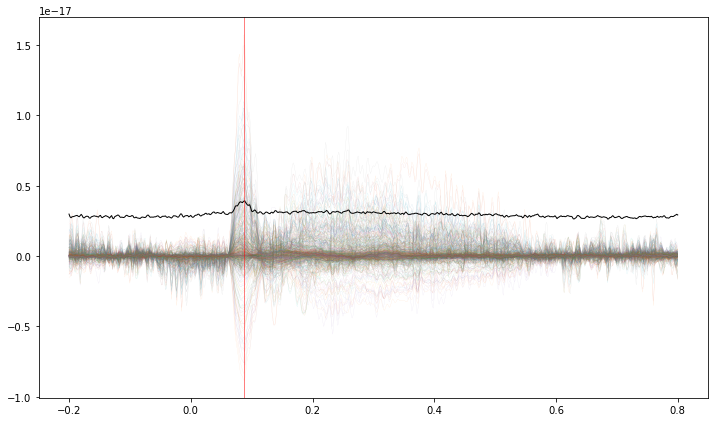

In [83]:
%matplotlib inline
f, ax = plt.subplots(1, figsize=(12,7))
mean_tr = np.mean(source_loc[10], axis=0)
mean_all = np.std(source_loc[10], axis=(0,1))
peak_ix = np.argmax(mean_all)-1
ax.plot(epochs_times, mean_tr.T, lw=0.2, alpha=0.2);
ax.plot(epochs_times, mean_all, color="black", lw=1, alpha=1);
ax.axvline(epochs_times[peak_ix], color="red", lw="0.5");

571

In [84]:
vtx_col = np.tile([220, 220, 220, 255], [lab_col_map.shape[0], 1])
peak_map = mean_tr[:,peak_ix]
vtx_col[ROI_maps["L_V1_ROI"]] = trimesh.visual.interpolate(peak_map, color_map="RdBu_r")

max_vert = np.argmax(peak_map)
vx_ix_peak = np.arange(len(ROI_maps["L_V1_ROI"]))[ROI_maps["L_V1_ROI"]][max_vert]
peak_loc = np.array(inflated.vertices[vx_ix_peak])
inflated = sio.load_mesh(pial_ds_inflated)
inflated.visual.vertex_colors = vtx_col

sphere = trimesh.creation.uv_sphere(radius=1)
sphere.visual.vertex_colors = np.array([99, 253, 9, 255])
sphere.apply_translation(peak_loc)

scene = trimesh.Scene([inflated, sphere])

scene.show(viewer="notebook")

In [53]:
data = [i[:, max_vert, :] for i in source_loc]

In [54]:
# distance
pial_ds_loc = nib.load(pial_ds_nodeep).agg_data()[0][vx_ix_peak]
white_ds_loc = nib.load(white_ds_nodeep).agg_data()[0][vx_ix_peak]
distance = euclidean(white_ds_loc, pial_ds_loc)

In [55]:
def compute_csd(surf_tcs, times, mean_dist, n_surfs):
    # Compute CSD
    nd=1;
    spacing=mean_dist*10**-3

    csd=np.zeros((n_surfs, surf_tcs.shape[1]))
    for t in range(surf_tcs.shape[1]):
        phi=surf_tcs[:,t]
        csd[0,t]=surf_tcs[0,t]
        csd[1,t]=surf_tcs[1,t]
        for z in range(2,n_surfs-3):
            csd[z,t]=(phi[z+2]-2*phi[z]+phi[z-2])/((nd*spacing)**2)
        csd[-2,t]=surf_tcs[-2,t]
        csd[-1,t]=surf_tcs[-1,t]            
    
    return csd

def csd_layer(data, mean_distance, n_surfs, nd=1):
    spacing = mean_distance*10*1e-3
    output_shape = data.shape
    csd = np.zeros(output_shape)
    for t in range(output_shape[1]):
        phi = data[:, t]
        csd[0, t] = data[0, t]
        csd[1, t] = data[1, t]
        for z in range(2, n_surfs-3):
            csd[z, t] = (phi[z+2]-2*phi[z-2])/((nd*spacing)**2)
        csd[-2, t] = data[-2, t]
        csd[-1, t] = data[-1, t]  
    return csd


def smooth_csd(csd, n_surfs):
    # interpolate CSD in space
    y = np.linspace(0,n_surfs-1,n_surfs)
    Yi=np.linspace(0,n_surfs-1,500)
    
    f=interp1d(y,csd,kind='cubic',axis=0)
    csd_smooth=f(Yi)
    
    csd_smooth=savgol_filter(csd_smooth, 51, 3, axis=1)
    
    return csd_smooth

In [69]:
# 1. MU unf: CSP per trial -> average
data_csp = np.array(data[::-1]) # inverting the order of layers
data_csp = [data_csp[:,i,:] for i in range(data_csp.shape[1])]
n_surfs = 11
mean_distance = distance / (n_surfs -1)


In [86]:
data_csp[0].shape

(11, 601)

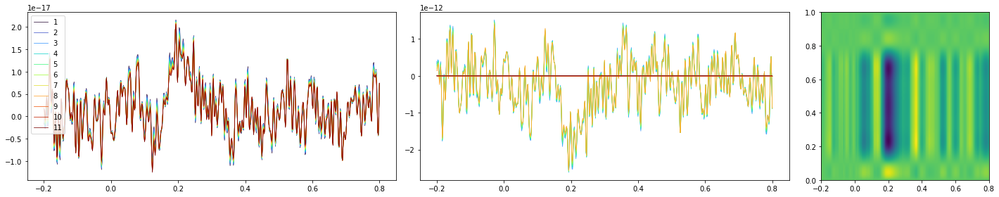

In [70]:
%matplotlib inline
csd = csd_layer(data_csp[0], mean_distance, n_surfs)
colour_range = plt.cm.turbo(np.linspace(0, 1, num=n_surfs))
f, ax = plt.subplots(1, 3, figsize=(20,4), gridspec_kw={'width_ratios': [0.4, 0.4, 0.2]})
for surf in range(n_surfs):
    ax[0].plot(epochs_times, data_csp[0][surf], lw=0.75, c=colour_range[surf], label=surf+1);
    ax[1].plot(epochs_times, csd[surf], lw=0.75, c=colour_range[surf]);
ax[2].imshow(smooth_csd(csd, n_surfs), origin="lower", extent=[epochs_times[0], epochs_times[-1], 0, 1], );
ax[0].legend()

plt.tight_layout()

In [71]:
all_csd = [csd_layer(i, mean_distance, n_surfs) for i in data_csp]
all_smooth_csd = [smooth_csd(i, n_surfs) for i in all_csd]

In [72]:
rows = len(all_smooth_csd) // 5 +1
rc_list = list(it.product(range(rows),range(5)))[:len(all_smooth_csd)]
vmax = np.max(np.abs(np.array(all_smooth_csd)))
divnorm=colors.TwoSlopeNorm(vmin=-vmax, vcenter=0, vmax=vmax)

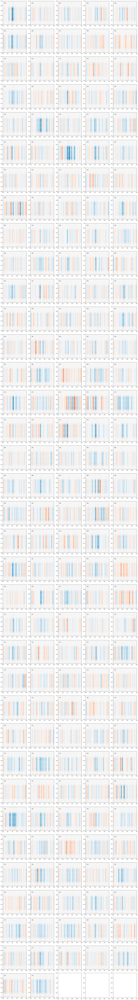

In [73]:
%matplotlib inline

f, ax = plt.subplots(rows, 5, figsize=(20,4*rows), facecolor="white")
for ix , (r, c) in enumerate(rc_list):
    # ax[r,c].imshow(all_smooth_csd[ix], origin="lower", extent=[epochs_times[0], epochs_times[-1], 0, 1], cmap="RdBu_r");
    ax[r,c].imshow(all_smooth_csd[ix], origin="lower", norm=divnorm, extent=[epochs_times[0], epochs_times[-1], 0, 1], cmap="RdBu_r");
    ax[r,c].text(-0.15, 0.9, str(ix).zfill(3), fontsize=10)
plt.tight_layout()
plt.savefig("assets/CSD_trials_indv_MT_L.png", dpi=120)

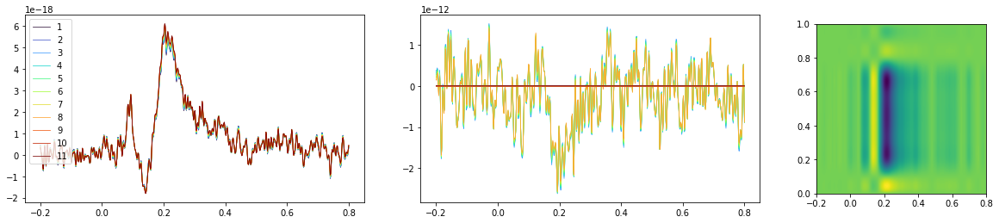

In [74]:
%matplotlib inline
colour_range = plt.cm.turbo(np.linspace(0, 1, num=n_surfs))
f, ax = plt.subplots(1, 3, figsize=(20,4), gridspec_kw={'width_ratios': [0.4, 0.4, 0.2]})
mean_layer = np.mean(data_csp, axis=0)
mean_csd = np.mean(all_csd, axis=0)
mean_smooth_csd = np.mean(all_smooth_csd, axis=0)
for surf in range(n_surfs):
    ax[0].plot(epochs_times, mean_layer[surf], lw=0.75, c=colour_range[surf], label=surf+1)
    ax[1].plot(epochs_times, csd[surf], lw=0.75, c=colour_range[surf])
ax[2].imshow(mean_smooth_csd, origin="lower", extent=[epochs_times[0], epochs_times[-1], 0, 1], )
ax[0].legend();

In [76]:
# 2. filter -> CSP per trial -> average
filt_data_csp = [filter_data(i, sfreq=600, l_freq=0, h_freq=30, verbose=False) for i in data_csp]
all_f_csd = [csd_layer(i, mean_distance, n_surfs) for i in filt_data_csp]
all_smooth_f_csd = [smooth_csd(i, n_surfs) for i in all_f_csd]

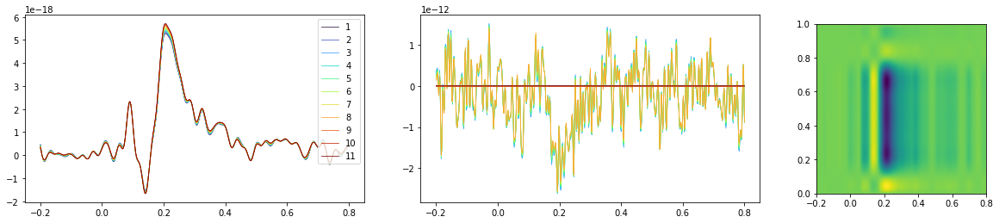

In [77]:
%matplotlib inline
colour_range = plt.cm.turbo(np.linspace(0, 1, num=n_surfs))
f, ax = plt.subplots(1, 3, figsize=(20,4), gridspec_kw={'width_ratios': [0.4, 0.4, 0.2]})
mean_layer = np.mean(filt_data_csp, axis=0)
mean_csd = np.mean(all_f_csd, axis=0)
mean_smooth_csd = np.mean(all_smooth_f_csd, axis=0)
for surf in range(n_surfs):
    ax[0].plot(epochs_times, mean_layer[surf], lw=0.75, c=colour_range[surf], label=surf+1)
    ax[1].plot(epochs_times, csd[surf], lw=0.75, c=colour_range[surf])
ax[2].imshow(mean_smooth_csd, origin="lower", extent=[epochs_times[0], epochs_times[-1], 0, 1], )
ax[0].legend()

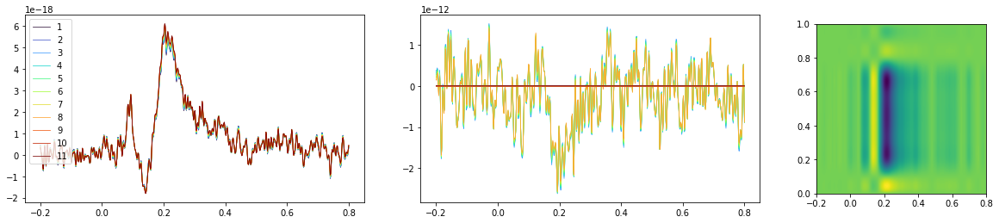

In [78]:
# 3. average -> CSP
%matplotlib inline
colour_range = plt.cm.turbo(np.linspace(0, 1, num=n_surfs))
f, ax = plt.subplots(1, 3, figsize=(20,4), gridspec_kw={'width_ratios': [0.4, 0.4, 0.2]})
mean_layer = np.mean(data_csp, axis=0)
mean_csd = csd_layer(mean_layer, mean_distance, n_surfs)
mean_smooth_csd = smooth_csd(mean_csd, n_surfs)
for surf in range(n_surfs):
    ax[0].plot(epochs_times, mean_layer[surf], lw=0.75, c=colour_range[surf], label=surf+1)
    ax[1].plot(epochs_times, csd[surf], lw=0.75, c=colour_range[surf])
ax[2].imshow(mean_smooth_csd, origin="lower", extent=[epochs_times[0], epochs_times[-1], 0, 1], )
ax[0].legend()

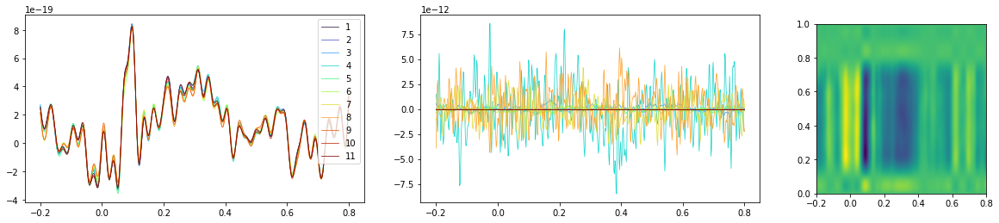

In [230]:
# 4. average -> filter -> CSP
%matplotlib inline
colour_range = plt.cm.turbo(np.linspace(0, 1, num=n_surfs))
f, ax = plt.subplots(1, 3, figsize=(20,4), gridspec_kw={'width_ratios': [0.4, 0.4, 0.2]})
mean_layer = np.mean(data_csp, axis=0)
mean_layer = filter_data(mean_layer, sfreq=600, l_freq=0, h_freq=30, verbose=False)
mean_csd = csd_layer(mean_layer, mean_distance, n_surfs)
mean_smooth_csd = smooth_csd(mean_csd, n_surfs)
for surf in range(n_surfs):
    ax[0].plot(epochs_times, mean_layer[surf], lw=0.75, c=colour_range[surf], label=surf+1)
    ax[1].plot(epochs_times, csd[surf], lw=0.75, c=colour_range[surf])
ax[2].imshow(mean_smooth_csd, origin="lower", extent=[epochs_times[0], epochs_times[-1], 0, 1], )
ax[0].legend()